In [1]:
!pip install category_encoders


In [2]:
!pip install --upgrade scikit-learn
!pip install --upgrade imbalanced-learn


  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/6e/1b/66764ecf370e797759be06fb38c11640ea1f9456ae10f8640a33cfa726ea/imbalanced_learn-0.12.2-py3-none-any.whl.metadata
  Using cached imbalanced_learn-0.12.2-py3-none-any.whl.metadata (8.2 kB)
Using cached imbalanced_learn-0.12.2-py3-none-any.whl (257 kB)
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.8.1
    Uninstalling imbalanced-learn-0.8.1:
      Successfully uninstalled imbalanced-learn-0.8.1


In [3]:
!pip uninstall scikit-learn -y
!pip uninstall imbalanced-learn -y
!pip install scikit-learn==1.0.2
!pip install imbalanced-learn==0.8.1


Found existing installation: scikit-learn 1.4.2

ERROR: Exception:
Traceback (most recent call last):
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_internal\cli\base_command.py", line 180, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_internal\commands\uninstall.py", line 110, in run
    uninstall_pathset.commit()
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_internal\req\req_uninstall.py", line 432, in commit
    self._moved_paths.commit()
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_internal\req\req_uninstall.py", line 278, in commit
    save_dir.cleanup()
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_internal\utils\temp_dir.py", line 173, in cleanup
    rmtree(self._path)
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_vendor\tenacity\__init__.py", line 291, in wrapped_f
    return self(f, *args, **kw)
           ^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_vend


Uninstalling scikit-learn-1.4.2:
  Successfully uninstalled scikit-learn-1.4.2
Found existing installation: imbalanced-learn 0.12.2
Uninstalling imbalanced-learn-0.12.2:
  Successfully uninstalled imbalanced-learn-0.12.2
  Using cached scikit-learn-1.0.2.tar.gz (6.7 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'error'


  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [66 lines of output]
      Partial import of sklearn during the build process.
      setup.py:128: DeprecationWarning:
      
        `numpy.distutils` is deprecated since NumPy 1.23.0, as a result
        of the deprecation of `distutils` itself. It will be removed for
        Python >= 3.12. For older Python versions it will remain present.
        It is recommended to use `setuptools < 60.0` for those Python versions.
        For more details, see:
          https://numpy.org/devdocs/reference/distutils_status_migration.html
      
      
        from numpy.distutils.command.build_ext import build_ext  # noqa
      INFO: No module named 'numpy.distutils._msvccompiler' in numpy.distutils; trying from distutils
      Traceback (most recent call last):
        File "C:\Users\halha\anaconda3\Lib\site-packages\pip\_vendor\pyproject_hooks\_in_process\_in_proces

  Obtaining dependency information for imbalanced-learn==0.8.1 from https://files.pythonhosted.org/packages/b1/bd/4bb46fb4d317fd0f19aa7463d8906598e5fee073c0842b57cb112f023a45/imbalanced_learn-0.8.1-py3-none-any.whl.metadata
  Using cached imbalanced_learn-0.8.1-py3-none-any.whl.metadata (12 kB)
  Obtaining dependency information for scikit-learn>=0.24 from https://files.pythonhosted.org/packages/79/3d/02d5d3ed359498fec3abdf65407d3c07e3b8765af17464969055aaec5171/scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata
  Using cached scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata (11 kB)
Using cached imbalanced_learn-0.8.1-py3-none-any.whl (189 kB)
Using cached scikit_learn-1.4.2-cp311-cp311-win_amd64.whl (10.6 MB)


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from category_encoders.ordinal import OrdinalEncoder
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

import xgboost as xgb
from sklearn.model_selection import GridSearchCV


from sklearn.model_selection import KFold
import time


from sklearn.metrics import mean_squared_error, r2_score

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tabulate import tabulate


import warnings
warnings.filterwarnings('ignore')

In [6]:
df = pd.read_csv(r"C:\Users\halha\OneDrive\Masaüstü\Proje3\fraud_oracle.csv")

In [7]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15420 entries, 0 to 15419
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Month                 15420 non-null  object
 1   WeekOfMonth           15420 non-null  int64 
 2   DayOfWeek             15420 non-null  object
 3   Make                  15420 non-null  object
 4   AccidentArea          15420 non-null  object
 5   DayOfWeekClaimed      15420 non-null  object
 6   MonthClaimed          15420 non-null  object
 7   WeekOfMonthClaimed    15420 non-null  int64 
 8   Sex                   15420 non-null  object
 9   MaritalStatus         15420 non-null  object
 10  Age                   15420 non-null  int64 
 11  Fault                 15420 non-null  object
 12  PolicyType            15420 non-null  object
 13  VehicleCategory       15420 non-null  object
 14  VehiclePrice          15420 non-null  object
 15  FraudFound_P          15420 non-null

In [9]:
df.columns

Index(['Month', 'WeekOfMonth', 'DayOfWeek', 'Make', 'AccidentArea',
       'DayOfWeekClaimed', 'MonthClaimed', 'WeekOfMonthClaimed', 'Sex',
       'MaritalStatus', 'Age', 'Fault', 'PolicyType', 'VehicleCategory',
       'VehiclePrice', 'FraudFound_P', 'PolicyNumber', 'RepNumber',
       'Deductible', 'DriverRating', 'Days_Policy_Accident',
       'Days_Policy_Claim', 'PastNumberOfClaims', 'AgeOfVehicle',
       'AgeOfPolicyHolder', 'PoliceReportFiled', 'WitnessPresent', 'AgentType',
       'NumberOfSuppliments', 'AddressChange_Claim', 'NumberOfCars', 'Year',
       'BasePolicy'],
      dtype='object')

In [10]:
df.describe()

,WeekOfMonth,WeekOfMonthClaimed,Age,FraudFound_P,PolicyNumber,RepNumber,Deductible,DriverRating,Year
count,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000
mean,2.788586,2.693969,39.855707,0.059857,7710.500000,8.483268,407.704280,2.487808,1994.866472
std,1.287585,1.259115,13.492377,0.237230,4451.514911,4.599948,43.950998,1.119453,0.803313
min,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,300.000000,1.000000,1994.000000
25%,2.000000,2.000000,31.000000,0.000000,3855.750000,5.000000,400.000000,1.000000,1994.000000
50%,3.000000,3.000000,38.000000,0.000000,7710.500000,8.000000,400.000000,2.000000,1995.000000
75%,4.000000,4.000000,48.000000,0.000000,11565.250000,12.000000,400.000000,3.000000,1996.000000
max,5.000000,5.000000,80.000000,1.000000,15420.000000,16.000000,700.000000,4.000000,1996.000000


In [11]:
df.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision


In [12]:
df.isnull().sum()

Month                   0
WeekOfMonth             0
DayOfWeek               0
Make                    0
AccidentArea            0
DayOfWeekClaimed        0
MonthClaimed            0
WeekOfMonthClaimed      0
Sex                     0
MaritalStatus           0
Age                     0
Fault                   0
PolicyType              0
VehicleCategory         0
VehiclePrice            0
FraudFound_P            0
PolicyNumber            0
RepNumber               0
Deductible              0
DriverRating            0
Days_Policy_Accident    0
Days_Policy_Claim       0
PastNumberOfClaims      0
AgeOfVehicle            0
AgeOfPolicyHolder       0
PoliceReportFiled       0
WitnessPresent          0
AgentType               0
NumberOfSuppliments     0
AddressChange_Claim     0
NumberOfCars            0
Year                    0
BasePolicy              0
dtype: int64

In [13]:
df.duplicated().sum()

0

In [14]:
df = df.rename(columns={'FraudFound_P': 'FraudFound'})

In [15]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,6 years,31 to 35,No,No,External,none,no change,1 vehicle,1996,Collision
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,6 years,31 to 35,No,No,External,more than 5,no change,3 to 4,1996,Liability
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,5 years,26 to 30,No,No,External,1 to 2,no change,1 vehicle,1996,Collision
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,2 years,31 to 35,No,No,External,more than 5,no change,1 vehicle,1996,All Perils


In [16]:
df["FraudFound"].value_counts()

0    14497
1      923
Name: FraudFound, dtype: int64

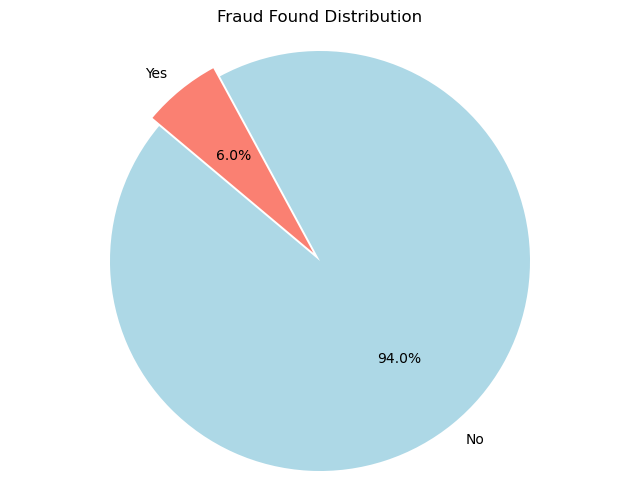

In [17]:
# Renkler
color_fraud = 'salmon'  # Dolandırıcılık yapanlar için kırmızı tonu
color_non_fraud = 'lightblue'  # Dolandırıcılık yapmayanlar için mavi tonu

# Veriyi hazırla
labels = df.FraudFound.value_counts().index
labels = ["No" if i==0 else "Yes" for i in labels]
sizes = df.FraudFound.value_counts().values

# Pastayı çiz
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, explode=[0.05, 0], colors=[color_non_fraud, color_fraud])
plt.title('Fraud Found Distribution')
plt.axis('equal') 
plt.show()



In [18]:
##Burada görmüş olacağınız üzere dolandırıcılık yapanlar %6

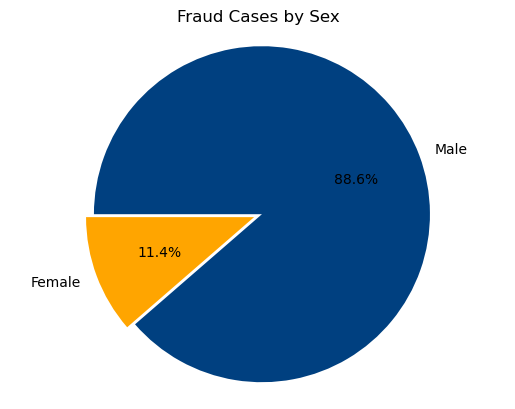

In [19]:
fraud_by_sex = df[df['FraudFound'] == 1].groupby('Sex').size()

# Renk paleti
main_color = '#004080'  # Ana Renk: Koyu Mavi
accent_color = '#FFA500'  # Birincil Vurgu: Turuncu
secondary_color = '#808080'  # İkincil Vurgu: Gri
optional_color = '#6FA8DC'  # Opsiyonel: Açık Mavi

colors = [accent_color, main_color]  # Belirtilen renkleri kullanma

# Grafik çizimi
fig, ax = plt.subplots()
ax.pie(fraud_by_sex, labels=fraud_by_sex.index, autopct='%1.1f%%', startangle=180, explode=[0.05, 0], colors=colors)
ax.axis('equal')  # Daire şeklinde tutar
ax.set_title('Fraud Cases by Sex')

plt.show()


In [20]:
##Burada görmüş olacağınız üzere dolandırıcılık yapanların cinsiyet dağılımları

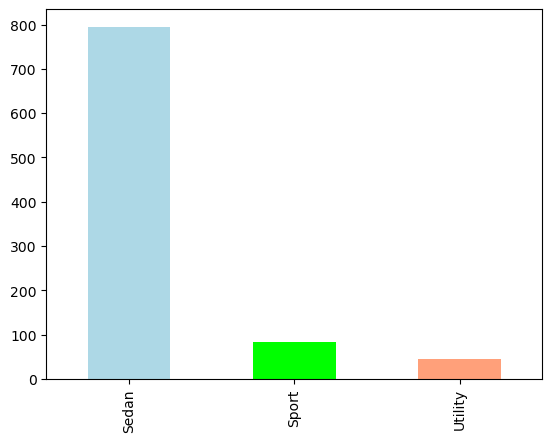

In [21]:
# Renkler
sedan_color = '#ADD8E6'  # Sedan için açık gri tonu
sport_color = '#00FF00'  # Sport için canlı yeşil
utility_color = '#FFA07A'  # Utility için yumuşak turuncu

# Filter the data for all claims that are Fraud
df_fraud = df[df['FraudFound'] == 1]  
# Count the number of claims in each vehicle category
fraud_counts = df_fraud['VehicleCategory'].value_counts()

# Grafik oluştur
fraud_counts.plot(kind='bar', color=[sedan_color, sport_color, utility_color])
plt.show()

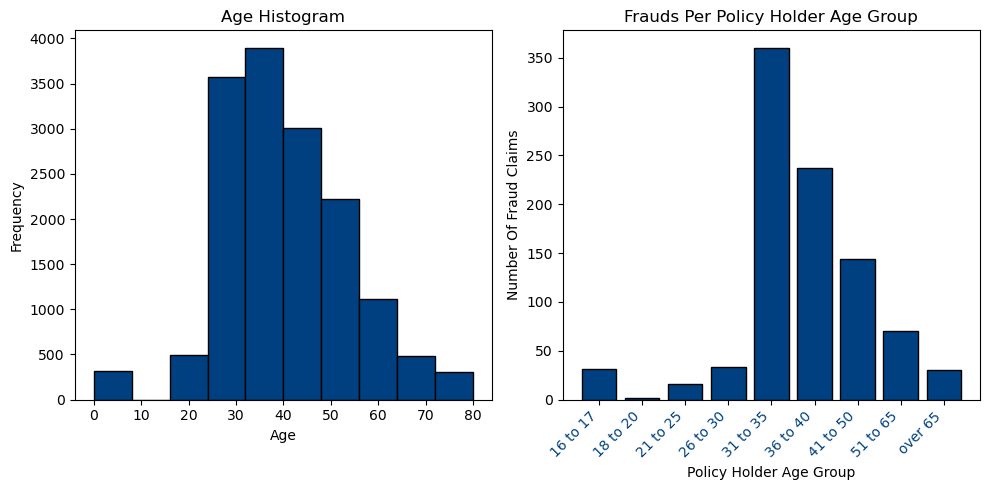

In [22]:
# Ana Renk: Koyu Mavi
main_color = '#004080'

plt.figure(figsize=(10, 5))

# Age histogram
plt.subplot(1, 2, 1)
plt.hist(df['Age'], bins=10, edgecolor='black', color=main_color)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Histogram')

# Frauds Per Policy Holder Age Group histogram
plt.subplot(1, 2, 2)
policyAge = df.groupby('AgeOfPolicyHolder')['FraudFound'].sum()
bars = plt.bar(policyAge.index, policyAge.values, edgecolor='black', color=main_color)
plt.title("Frauds Per Policy Holder Age Group")
plt.xlabel("Policy Holder Age Group")
plt.ylabel("Number Of Fraud Claims")
plt.xticks(rotation=45, ha='right', color=main_color)

plt.tight_layout()
plt.show()


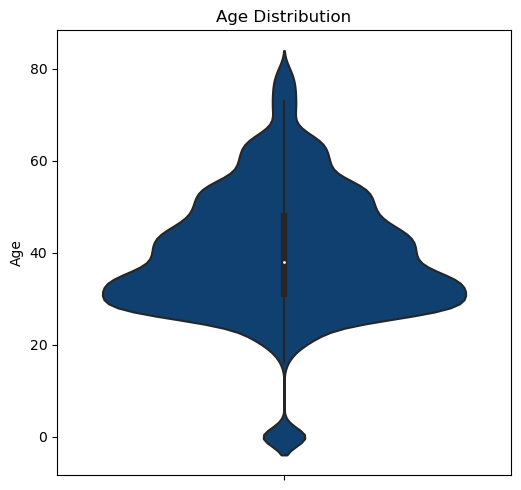

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ana Renk: Koyu Mavi
main_color = '#004080'

plt.figure(figsize=(10, 5))

# Violin Plot (Keman Grafiği)
plt.subplot(1, 2, 2)
sns.violinplot(data=df, y='Age', color=main_color)
plt.title("Age Distribution")
plt.ylabel("Age")

plt.tight_layout()
plt.show()


In [24]:
##Burada görmüş olduğımuz gibi yaş dağılımını açıklıyoruz

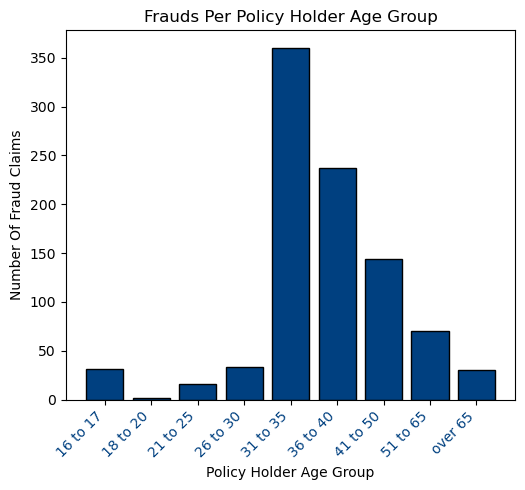

In [25]:
main_color = '#004080'

plt.figure(figsize=(10, 5))


# Frauds Per Policy Holder Age Group histogram
plt.subplot(1, 2, 2)
policyAge = df.groupby('AgeOfPolicyHolder')['FraudFound'].sum()
bars = plt.bar(policyAge.index, policyAge.values, edgecolor='black', color=main_color)
plt.title("Frauds Per Policy Holder Age Group")
plt.xlabel("Policy Holder Age Group")
plt.ylabel("Number Of Fraud Claims")
plt.xticks(rotation=45, ha='right', color=main_color)

plt.tight_layout()
plt.show()


In [26]:
#Burada Poliçe Sahibi Yaş Grubu Başına Dolandırıcılık grafiğini inceliyoruz

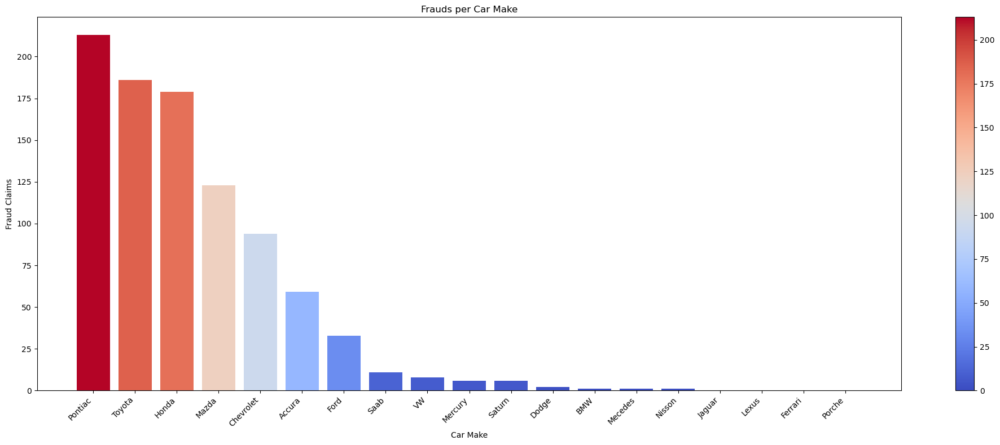

In [27]:
#Frauds per Car Make 
make_frauds = df.groupby('Make')['FraudFound'].sum()
make_frauds = make_frauds.sort_values(ascending=False)

norm = plt.Normalize(make_frauds.min(), make_frauds.max())
colors = plt.cm.coolwarm(norm(make_frauds.values))

plt.figure(figsize=(20, 8))
bars = plt.bar(make_frauds.index, make_frauds.values, color=colors)
plt.title("Frauds per Car Make")
plt.xlabel("Car Make")
plt.ylabel("Fraud Claims")


sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [28]:
#Burada dolandırıcılık yapılan arac markalarını görüyoruz

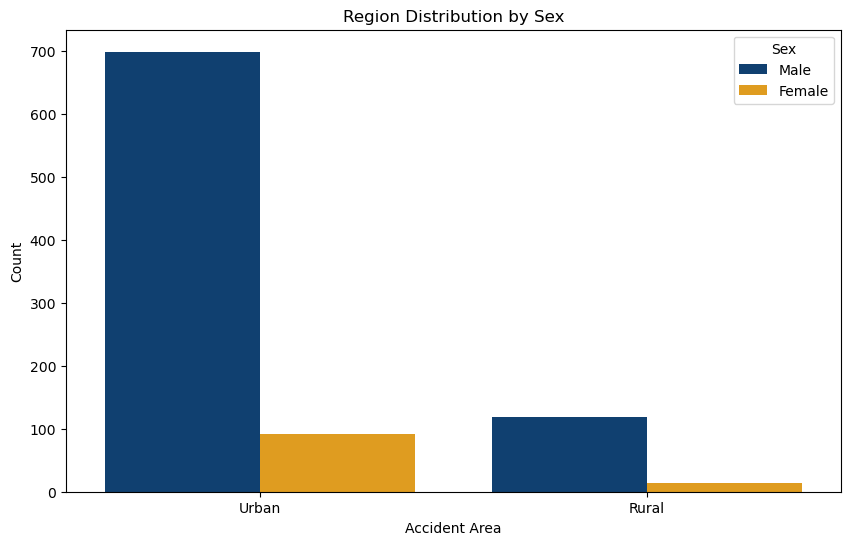

In [29]:
main_color = '#004080'  # Ana Renk: Koyu Mavi
accent_color = '#FFA500'  # Birincil Vurgu: Turuncu
secondary_color = '#808080'  # İkincil Vurgu: Gri
optional_color = '#6FA8DC'  # Opsiyonel: Açık Mavi

palette = [main_color, accent_color]

# Grafik çizimi
plt.figure(figsize=(10, 6))
sns.countplot(data=df[df['FraudFound'] == 1], x='AccidentArea', hue='Sex', palette=palette)
plt.title('Region Distribution by Sex')
plt.xlabel('Accident Area')
plt.ylabel('Count')
plt.legend(title='Sex')

plt.show()


In [30]:
# get rid of policy number column
df.drop(columns=['PolicyNumber'], inplace=True)

In [31]:
def get_unique_values_df(df):
    """
    Generate a DataFrame displaying unique values for each column in the input DataFrame.

    Parameters:
    df (DataFrame): Input DataFrame containing data.

    Returns:
    DataFrame: DataFrame with columns 'Column Name' and 'Unique Values'.
    """
    pd.set_option('max_colwidth', None)
    data = []
    for column in df:
        unique_values = ', '.join(map(str, df[column].unique()))
        data.append([column, unique_values])

    # Create a new DataFrame to display the unique values
    unique_values_df = pd.DataFrame(data, columns=['Column Name', 'Unique Values'])
    return unique_values_df







get_unique_values_df(df)

,Column Name,Unique Values
0,Month,"Dec, Jan, Oct, Jun, Feb, Nov, Apr, Mar, Aug, Jul, May, Sep"
1,WeekOfMonth,"5, 3, 2, 4, 1"
2,DayOfWeek,"Wednesday, Friday, Saturday, Monday, Tuesday, Sunday, Thursday"
3,Make,"Honda, Toyota, Ford, Mazda, Chevrolet, Pontiac, Accura, Dodge, Mercury, Jaguar, Nisson, VW, Saab, Saturn, Porche, BMW, Mecedes, Ferrari, Lexus"
4,AccidentArea,"Urban, Rural"
5,DayOfWeekClaimed,"Tuesday, Monday, Thursday, Friday, Wednesday, Saturday, Sunday, 0"
6,MonthClaimed,"Jan, Nov, Jul, Feb, Mar, Dec, Apr, Aug, May, Jun, Sep, Oct, 0"
7,WeekOfMonthClaimed,"1, 4, 2, 3, 5"
8,Sex,"Female, Male"
9,MaritalStatus,"Single, Married, Widow, Divorced"


In [32]:
# Age sütunundaki 0 değerlerini bul
age_zero_indices = df[df['Age'] == 0].index

# Rastgele 16 veya 17 değerleri oluştur
random_ages = np.random.choice([16, 17], size=len(age_zero_indices))

# 0 değerlerini rastgele 16 veya 17 ile değiştir
df.loc[age_zero_indices, 'Age'] = random_ages


In [33]:
# Age sütunundaki 0 ve -1 değerlerini bul
invalid_age_indices = df[df['Age'].isin([0, -1])].index

# Rastgele 16 veya 17 değerleri oluştur
random_ages = np.random.choice([16, 17], size=len(invalid_age_indices))

# 0 ve -1 değerlerini rastgele 16 veya 17 ile değiştir
df.loc[invalid_age_indices, 'Age'] = random_ages

# Yaş kategorilerini oluştur
conditions = [
    (df['Age'] >= 15) & (df['Age'] <= 31),
    (df['Age'] >= 32) & (df['Age'] <= 50),
    (df['Age'] > 50)
]

categories = ['genc', 'orta', 'yasli']

df['AgeCategory'] = np.select(conditions, categories, default=np.nan)

# Age sütununu sil
df.drop(columns=['Age'], inplace=True)


In [34]:
def get_unique_values_df(df):
    """
    Generate a DataFrame displaying unique values for each column in the input DataFrame.

    Parameters:
    df (DataFrame): Input DataFrame containing data.

    Returns:
    DataFrame: DataFrame with columns 'Column Name' and 'Unique Values'.
    """
    pd.set_option('max_colwidth', None)
    data = []
    for column in df:
        unique_values = ', '.join(map(str, df[column].unique()))
        data.append([column, unique_values])

    # Create a new DataFrame to display the unique values
    unique_values_df = pd.DataFrame(data, columns=['Column Name', 'Unique Values'])
    return unique_values_df







get_unique_values_df(df)

,Column Name,Unique Values
0,Month,"Dec, Jan, Oct, Jun, Feb, Nov, Apr, Mar, Aug, Jul, May, Sep"
1,WeekOfMonth,"5, 3, 2, 4, 1"
2,DayOfWeek,"Wednesday, Friday, Saturday, Monday, Tuesday, Sunday, Thursday"
3,Make,"Honda, Toyota, Ford, Mazda, Chevrolet, Pontiac, Accura, Dodge, Mercury, Jaguar, Nisson, VW, Saab, Saturn, Porche, BMW, Mecedes, Ferrari, Lexus"
4,AccidentArea,"Urban, Rural"
5,DayOfWeekClaimed,"Tuesday, Monday, Thursday, Friday, Wednesday, Saturday, Sunday, 0"
6,MonthClaimed,"Jan, Nov, Jul, Feb, Mar, Dec, Apr, Aug, May, Jun, Sep, Oct, 0"
7,WeekOfMonthClaimed,"1, 4, 2, 3, 5"
8,Sex,"Female, Male"
9,MaritalStatus,"Single, Married, Widow, Divorced"


In [35]:
df.drop(columns=['PolicyType'], inplace=True)    

In [36]:
# Function to categorize ranges
def categorize_range(value):
    if value == 'less than 20000':
        return 'low'
    elif value in ['20000 to 29000', '30000 to 39000']:
        return 'mid'
    elif value in ['40000 to 59000', '60000 to 69000', 'more than 69000']:
        return 'high'
    else:
        return 'mid'  # or handle as needed

# Apply categorization to DataFrame
df['VehiclePrice_Cat'] = df['VehiclePrice'].apply(categorize_range)

In [37]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,...,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy,AgeCategory,VehiclePrice_Cat
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,...,No,No,External,none,1 year,3 to 4,1994,Liability,genc,high
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,...,Yes,No,External,none,no change,1 vehicle,1994,Collision,orta,high
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,...,No,No,External,none,no change,1 vehicle,1994,Collision,orta,high
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,...,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability,yasli,mid
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,...,No,No,External,none,no change,1 vehicle,1994,Collision,genc,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,Nov,4,Friday,Toyota,Urban,Tuesday,Nov,5,Male,Married,...,No,No,External,none,no change,1 vehicle,1996,Collision,orta,mid
15416,Nov,5,Thursday,Pontiac,Urban,Friday,Dec,1,Male,Married,...,No,No,External,more than 5,no change,3 to 4,1996,Liability,genc,mid
15417,Nov,5,Thursday,Toyota,Rural,Friday,Dec,1,Male,Single,...,No,No,External,1 to 2,no change,1 vehicle,1996,Collision,genc,mid
15418,Dec,1,Monday,Toyota,Urban,Thursday,Dec,2,Female,Married,...,No,No,External,more than 5,no change,1 vehicle,1996,All Perils,orta,mid


In [38]:
# Initialize LabelEncoder for encoding categorical columns
label_encoder = LabelEncoder()

# Define mappings for ordinal encoding
col_ordering = [
    {'col':'PastNumberOfClaims','mapping':{'none':0 ,'1':1,'2 to 4':3,'more than 4':5 }},
    {'col':'NumberOfSuppliments','mapping':{'none':0,'1 to 2':1,'3 to 5':3,'more than 5':6}}, 
    {'col':'VehiclePrice','mapping':{'more than 69000':5,'20000 to 29000':1,'30000 to 39000':2,'less than 20000':0,
                                     '40000 to 59000':3,'60000 to 69000':4}},
    {'col':'AgeOfVehicle','mapping':{'new': 0, '2 years': 1, '3 years': 2, '4 years': 3, '5 years': 4, '6 years': 5, '7 years': 6, 'more than 7': 7}},
    {'col':'Year','mapping': {1994: 0, 1995: 1, 1996: 2}},
    {'col':'Days_Policy_Accident','mapping': {'none': 0, '1 to 7': 1,'8 to 15': 2,'15 to 30': 3, 'more than 30': 4}},
    {'col':'Days_Policy_Claim','mapping': {'none': 0, '1 to 7': 1,'8 to 15': 2,'15 to 30': 3, 'more than 30':4 }},
    {'col':'AddressChange_Claim','mapping': {'1 year': 1, 'no change': 0, '4 to 8 years': 4, '2 to 3 years': 2, 'under 6 months': 0.5}},
    {'col':'AgeCategory','mapping': {'genc': 0, 'orta': 1, 'yasli': 2}},
    {'col':'VehiclePrice_Cat','mapping': {'high': 2, 'mid': 1, 'low': 0}},
    {'col':'NumberOfCars','mapping': {'3 to 4': 3, '1 vehicle': 1, '2 vehicles': 2, '5 to 8': 7, 'more than 8': 9}},                  
]
ord_encoder = OrdinalEncoder(mapping = col_ordering, return_df=True)

df = ord_encoder.fit_transform(df)



# Encode remaining categorical columns using LabelEncoder
for col in df.columns:
    if df[col].dtype == 'object':  # Check if the column is categorical
        df[col] = label_encoder.fit_transform(df[col])


# see how the unique  data in the dataframe look like
get_unique_values_df(df)


,Column Name,Unique Values
0,Month,"2, 4, 10, 6, 3, 9, 0, 7, 1, 5, 8, 11"
1,WeekOfMonth,"5, 3, 2, 4, 1"
2,DayOfWeek,"6, 0, 2, 1, 5, 3, 4"
3,Make,"6, 17, 5, 9, 2, 13, 0, 3, 11, 7, 12, 18, 15, 16, 14, 1, 10, 4, 8"
4,AccidentArea,"1, 0"
5,DayOfWeekClaimed,"6, 2, 5, 1, 7, 3, 4, 0"
6,MonthClaimed,"5, 10, 6, 4, 8, 3, 1, 2, 9, 7, 12, 11, 0"
7,WeekOfMonthClaimed,"1, 4, 2, 3, 5"
8,Sex,"0, 1"
9,MaritalStatus,"2, 1, 3, 0"


In [39]:
# We can see that the data is imbalanced
print('Number of records not  commited fraud: ',len(df[df['FraudFound']==0]))
print('Number of records commited fraud: ',len(df[df['FraudFound']==1]))
print('The total number of records is: ', len(df))




Number of records not  commited fraud:  14497
Number of records commited fraud:  923
The total number of records is:  15420


In [40]:
print('Out of all % of records not commited fraud==> ',len(df[df['FraudFound']==0])/len(df)*100)
print('Out of all % of records commited fraud==> ',len(df[df['FraudFound']==1])/len(df)*100)


Out of all % of records not commited fraud==>  94.01426718547341
Out of all % of records commited fraud==>  5.985732814526589


In [41]:
pd.set_option('display.max_columns', None)

In [42]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Fault,VehicleCategory,VehiclePrice,FraudFound,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy,AgeCategory,VehiclePrice_Cat
0,2,5,6,6,1,6,5,1,0,2,0,1,5,0,12,300,1,4,4,0,2,3,0,0,0,0,1,3,0,2,0,2
1,4,3,6,6,1,2,5,4,1,2,0,1,5,0,15,400,4,4,4,0,5,4,1,0,0,0,0,1,0,1,1,2
2,10,5,0,6,1,5,10,2,1,1,0,1,5,0,7,400,3,4,4,1,6,6,0,0,0,0,0,1,0,1,1,2
3,6,2,2,17,0,1,6,1,1,1,1,1,1,0,4,400,2,4,4,1,7,7,1,0,0,6,0,1,0,2,2,1
4,4,5,1,6,1,6,4,2,0,2,1,1,5,0,3,400,1,4,4,0,4,4,0,0,0,0,0,1,0,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,9,4,0,17,1,6,10,5,1,1,0,0,1,1,5,400,4,4,4,3,5,4,0,0,0,0,0,1,2,1,1,1
15416,9,5,4,13,1,1,3,1,1,1,0,1,2,0,11,400,3,4,4,5,5,4,0,0,0,6,0,3,2,2,0,1
15417,9,5,4,17,0,1,3,1,1,2,0,0,1,1,4,400,4,4,4,5,4,3,0,0,0,1,0,1,2,1,0,1
15418,2,1,1,17,1,5,3,2,0,1,1,0,1,0,6,400,4,4,4,0,1,4,0,0,0,6,0,1,2,0,1,1


In [43]:
X = df.iloc[:, 14:]
y = df.iloc[:,0]

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f'X_Train: {X_train.shape}, y_train: {y_train.shape}, X_test: {X_test.shape}, y_test: {y_test.shape}')

X_Train: (12336, 18), y_train: (12336,), X_test: (3084, 18), y_test: (3084,)


In [45]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [46]:
importances_dt = pd.DataFrame({'Feature':X_train.columns,'Importance':np.round(dt_model.feature_importances_,3)})
importances_dt = importances_dt.sort_values('Importance', ascending=False).set_index('Feature')
importances_dt

,Importance
Feature,
RepNumber,0.244
DriverRating,0.116
PastNumberOfClaims,0.106
NumberOfSuppliments,0.100
AgeOfVehicle,0.100
AgeOfPolicyHolder,0.092
BasePolicy,0.076
VehiclePrice_Cat,0.051
AgeCategory,0.050


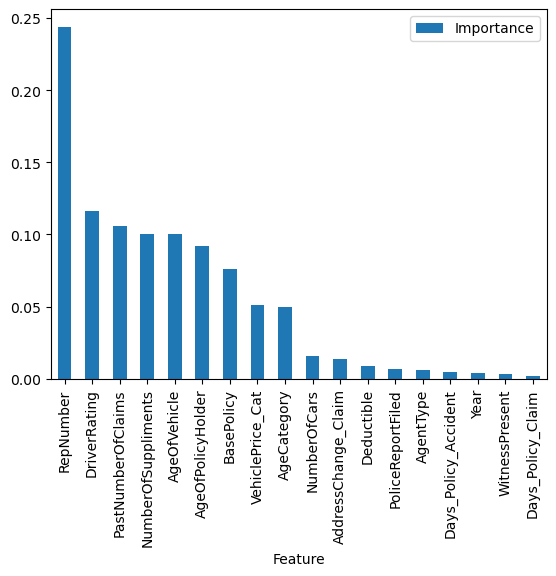

In [47]:
importances_dt.plot.bar();

In [48]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train);

In [49]:
from sklearn.metrics import confusion_matrix

# Örnek olarak y_pred_rf ve y_test değişkenlerini kullanarak confusion matrix hesaplaması
y_pred_rf = rf_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred_rf)

print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[25 17 19 27 22 18 25 24 20 18 23 21]
 [16  9 35 15 25 15 14 16 18 11 21 22]
 [18 27 23 28 16 14 18 25 24 20 30 25]
 [20  8 16 28 22 29 28 23 21 18 16 19]
 [22 12 20 23 27 27 36 35 30 20 23 18]
 [22 12 17 15 21 18 27 18 26 24 20 18]
 [20 25 14 19 22 27 18 20 36 20 22 19]
 [17 24 21 25 29 26 23 22 15 19 14 25]
 [26 23 24 25 38 18 31 33 28 23 23 11]
 [16 27 23 15 23 16 24 24 22 20 22 15]
 [22 23 21 11 22 15 25 14 22 19 35 20]
 [17 15 24 21 16 19 20 14 20 15 35 24]]


In [50]:
importances_rf = pd.DataFrame({'Feature':X_train.columns,'Importance':np.round(rf_model.feature_importances_,3)})
importances_rf = importances_rf.sort_values('Importance', ascending=False).set_index('Feature')
importances_rf

,Importance
Feature,
RepNumber,0.252
DriverRating,0.112
PastNumberOfClaims,0.102
NumberOfSuppliments,0.094
AgeOfVehicle,0.088
AgeOfPolicyHolder,0.083
BasePolicy,0.070
VehiclePrice_Cat,0.048
Year,0.045


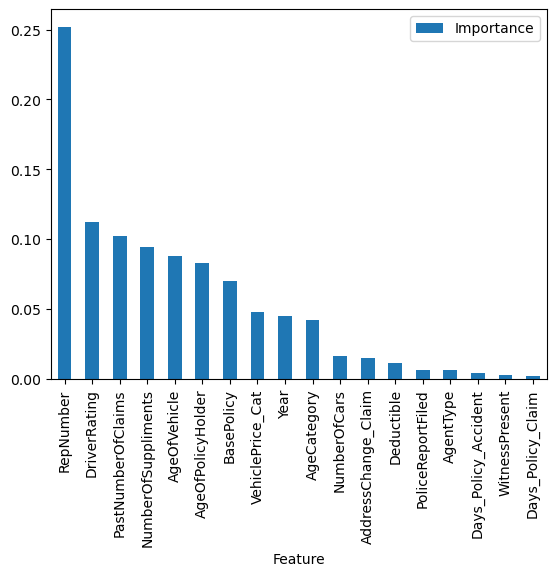

In [51]:
importances_rf.plot.bar();

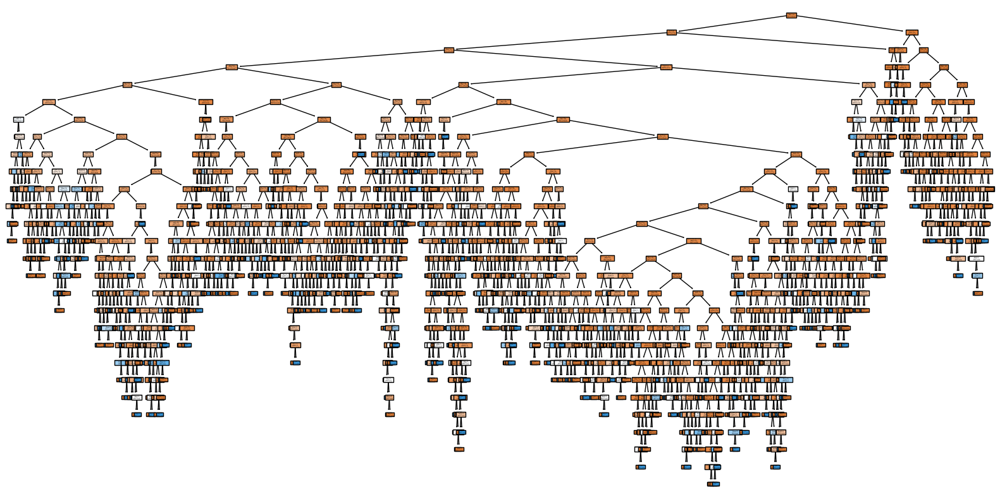

In [52]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# Hedef sütunu hariç, bağımsız değişkenleri seçelim
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Karar ağacı modelini oluşturalım
dt_model = DecisionTreeClassifier()
dt_model.fit(X, y)

# Karar ağacını görselleştirelim
plt.figure(figsize=(20,10))
plot_tree(dt_model, filled=True, feature_names=X.columns.tolist(), class_names=['No Fraud', 'Fraud'])
plt.show()

In [53]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# Hedef sütunu hariç, bağımsız değişkenleri seçelim
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Karar ağacı modelini oluşturalım
dt_model = DecisionTreeClassifier()
dt_model.fit(X, y)

# Karar ağacını görselleştirelim, DPI ve figür boyutunu ayarlayarak
plt.figure(figsize=(30,20), dpi=1000)
plot_tree(dt_model, filled=True, feature_names=X.columns.tolist(), class_names=['No Fraud', 'Fraud'])
plt.show()

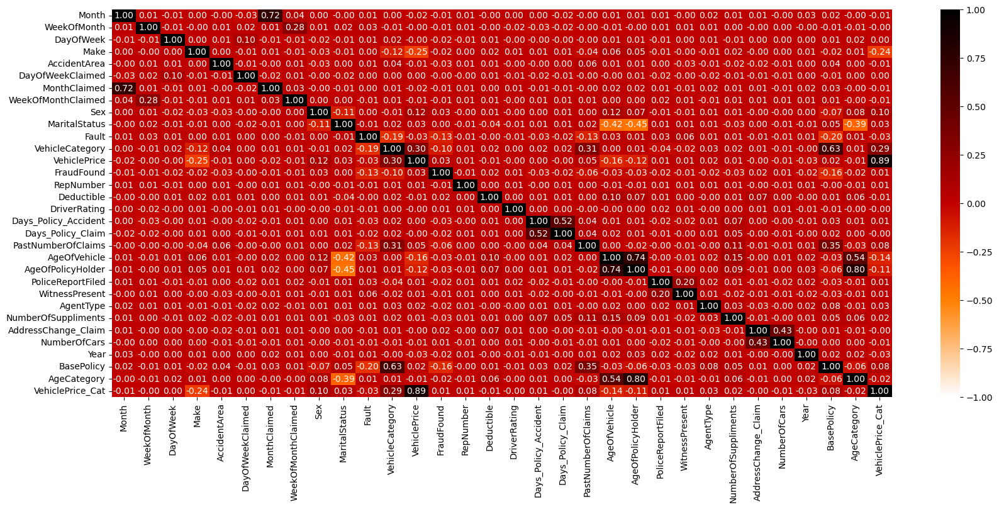

In [54]:
plt.figure(figsize=[20,8])
sns.heatmap(df.corr(), cmap="gist_heat_r", annot=True, vmin=-1, vmax=1, fmt='.2f');

In [55]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Karar ağacı modelini oluşturalım ve eğitelim
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = dt_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("Modelin doğruluk skoru:", accuracy)

Modelin doğruluk skoru: 0.8913748378728924


In [56]:
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

# Hassasiyet, duyarlılık ve F1 skoru
print(classification_report(y_test, y_pred))

# ROC eğrisi altında kalan alan (AUC) hesaplama
auc = roc_auc_score(y_test, y_pred)
print("ROC AUC Score:", auc)

# Çapraz doğrulama ile modeli değerlendirme
cv_scores = cross_val_score(dt_model, X, y, cv=5)
print("Çapraz Doğrulama Skorları:", cv_scores)

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      2887
           1       0.21      0.25      0.23       197

    accuracy                           0.89      3084
   macro avg       0.58      0.59      0.58      3084
weighted avg       0.90      0.89      0.90      3084

ROC AUC Score: 0.5919789217901357
Çapraz Doğrulama Skorları: [0.8887808  0.89202335 0.88197147 0.89461738 0.90110246]


In [57]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost modelini tanımlayalım ve parametreleri ayarlayalım
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Modeli eğitelim
xgb_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = xgb_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("Modelin doğruluk skoru:", accuracy)


Modelin doğruluk skoru: 0.935473411154345


In [58]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest modelini tanımlayalım ve eğitelim
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = rf_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("Modelin doğruluk skoru:", accuracy)


Modelin doğruluk skoru: 0.9364461738002594


In [59]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# K-Nearest Neighbors modelini tanımlayalım ve eğitelim
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = knn_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("K-Nearest Neighbors Modelinin doğruluk skoru:", accuracy)


K-Nearest Neighbors Modelinin doğruluk skoru: 0.9341763942931258


In [60]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Gradient Boosting modelini tanımlayalım ve eğitelim
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = gb_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("Gradient Boosting Modelinin doğruluk skoru:", accuracy)


Gradient Boosting Modelinin doğruluk skoru: 0.9393644617380026


In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Logistic Regression modelini tanımlayalım ve eğitelim
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

# Test verileriyle modeli değerlendirelim
y_pred = lr_model.predict(X_test)

# Modelin doğruluk skorunu hesaplayalım
accuracy = accuracy_score(y_test, y_pred)
print("Logistic Regression Modelinin doğruluk skoru:", accuracy)


Logistic Regression Modelinin doğruluk skoru: 0.9357976653696498


In [62]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree modelini tanımlayalım ve eğitelim
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Random Forest modelini tanımlayalım ve eğitelim
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# XGBoost modelini tanımlayalım ve eğitelim
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
xgb_model.fit(X_train, y_train)

# Model sonuçlarını değerlendirelim
models = {
    "Decision Tree": dt_model,
    "Random Forest": rf_model,
    "XGBoost": xgb_model
}

results = {}

for name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy

# Sonuçları ekrana yazdırın
print("Model Karşılaştırması:")
print("----------------------")
for name, accuracy in results.items():
    print(f"{name}: {accuracy:.4f} doğruluk skoru")


Model Karşılaştırması:
----------------------
Decision Tree: 0.8878 doğruluk skoru
Random Forest: 0.9364 doğruluk skoru
XGBoost: 0.9355 doğruluk skoru


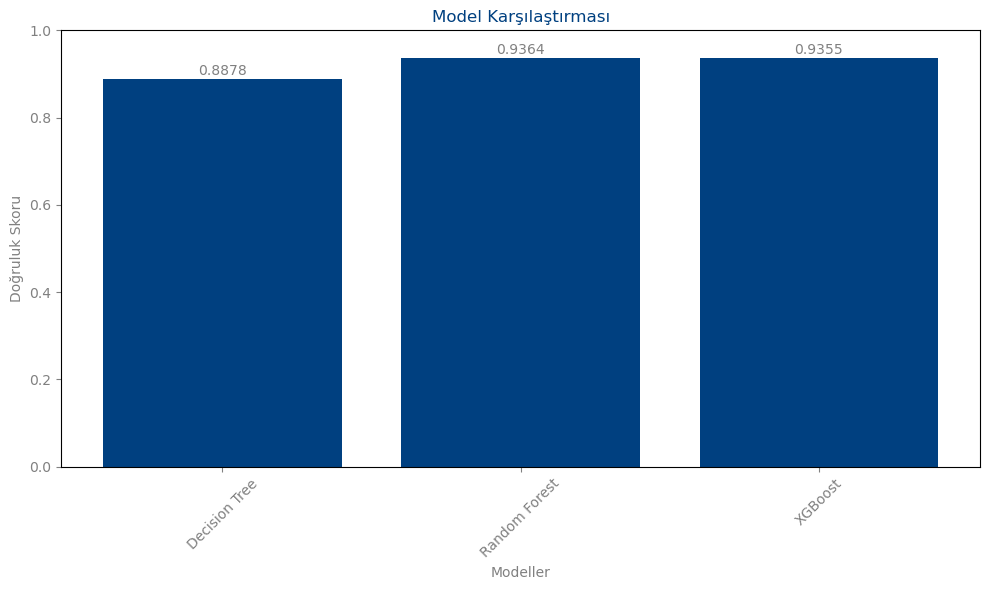

In [63]:
import matplotlib.pyplot as plt

# Model isimleri ve doğruluk skorları
model_names = list(results.keys())
accuracies = list(results.values())

# Renk paleti
main_color = '#004080'      # Ana Renk: Koyu Mavi
accent_color = '#FFA500'    # Birincil Vurgu: Turuncu
secondary_color = '#808080' # İkincil Vurgu: Gri
optional_color = '#6FA8DC'  # Opsiyonel: Açık Mavi

# Çubuk grafik oluşturma
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, accuracies, color=main_color)

# Doğruluk skorlarını çubukların üzerine yazma
for bar, accuracy in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height() + 0.01,
             f'{accuracy:.4f}',
             ha='center',
             color=secondary_color)

# Grafik başlığı ve eksen etiketleri
plt.title('Model Karşılaştırması', color=main_color)
plt.xlabel('Modeller', color=secondary_color)
plt.ylabel('Doğruluk Skoru', color=secondary_color)

# Eksen renkleri
plt.tick_params(axis='x', colors=secondary_color)
plt.tick_params(axis='y', colors=secondary_color)

# Grafik gösterme
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Bağımsız değişkenler (X) ve bağımlı değişken (y) olarak ayıralım
X = df.drop('FraudFound', axis=1)
y = df['FraudFound']

# Eğitim ve test veri kümelerini ayıralım
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree modelini tanımlayalım ve eğitelim
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Random Forest modelini tanımlayalım ve eğitelim
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# XGBoost modelini tanımlayalım ve eğitelim
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
xgb_model.fit(X_train, y_train)

# Logistic Regression modelini tanımlayalım ve eğitelim
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

# Gradient Boosting modelini tanımlayalım ve eğitelim
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)

# K-Nearest Neighbors modelini tanımlayalım ve eğitelim
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)

# Model sonuçlarını değerlendirelim
models = {
    "Decision Tree": dt_model,
    "Random Forest": rf_model,
    "XGBoost": xgb_model,
    "Logistic Regression": lr_model,
    "Gradient Boosting": gb_model,
    "K-Nearest Neighbors": knn_model
}

results = {}

for name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy

# Sonuçları ekrana yazdırın
print("Model Karşılaştırması:")
print("----------------------")
for name, accuracy in results.items():
    print(f"{name}: {accuracy:.4f} doğruluk skoru")


Model Karşılaştırması:
----------------------
Decision Tree: 0.8878 doğruluk skoru
Random Forest: 0.9364 doğruluk skoru
XGBoost: 0.9355 doğruluk skoru
Logistic Regression: 0.9358 doğruluk skoru
Gradient Boosting: 0.9394 doğruluk skoru
K-Nearest Neighbors: 0.9342 doğruluk skoru


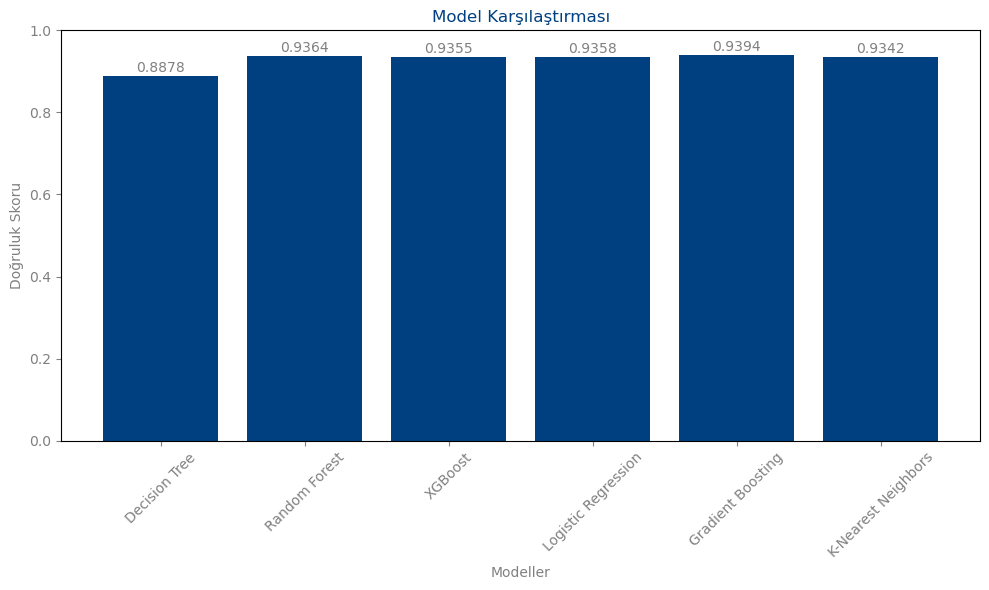

In [65]:
import matplotlib.pyplot as plt

# Model isimleri ve doğruluk skorları
model_names = list(results.keys())
accuracies = list(results.values())

# Renk paleti
main_color = '#004080'      # Ana Renk: Koyu Mavi
accent_color = '#FFA500'    # Birincil Vurgu: Turuncu
secondary_color = '#808080' # İkincil Vurgu: Gri
optional_color = '#6FA8DC'  # Opsiyonel: Açık Mavi

# Çubuk grafik oluşturma
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, accuracies, color=main_color)

# Doğruluk skorlarını çubukların üzerine yazma
for bar, accuracy in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height() + 0.01,
             f'{accuracy:.4f}',
             ha='center',
             color=secondary_color)

# Grafik başlığı ve eksen etiketleri
plt.title('Model Karşılaştırması', color=main_color)
plt.xlabel('Modeller', color=secondary_color)
plt.ylabel('Doğruluk Skoru', color=secondary_color)

# Eksen renkleri
plt.tick_params(axis='x', colors=secondary_color)
plt.tick_params(axis='y', colors=secondary_color)

# Grafik gösterme
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [66]:
!pip install joblib

In [67]:
from joblib import dump, load

# Modeli pickle kullanarak kaydetme
dump(gb_model, 'gb_modelnew.pkl')

['gb_modelnew.pkl']

In [68]:
df

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Fault,VehicleCategory,VehiclePrice,FraudFound,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy,AgeCategory,VehiclePrice_Cat
0,2,5,6,6,1,6,5,1,0,2,0,1,5,0,12,300,1,4,4,0,2,3,0,0,0,0,1,3,0,2,0,2
1,4,3,6,6,1,2,5,4,1,2,0,1,5,0,15,400,4,4,4,0,5,4,1,0,0,0,0,1,0,1,1,2
2,10,5,0,6,1,5,10,2,1,1,0,1,5,0,7,400,3,4,4,1,6,6,0,0,0,0,0,1,0,1,1,2
3,6,2,2,17,0,1,6,1,1,1,1,1,1,0,4,400,2,4,4,1,7,7,1,0,0,6,0,1,0,2,2,1
4,4,5,1,6,1,6,4,2,0,2,1,1,5,0,3,400,1,4,4,0,4,4,0,0,0,0,0,1,0,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15415,9,4,0,17,1,6,10,5,1,1,0,0,1,1,5,400,4,4,4,3,5,4,0,0,0,0,0,1,2,1,1,1
15416,9,5,4,13,1,1,3,1,1,1,0,1,2,0,11,400,3,4,4,5,5,4,0,0,0,6,0,3,2,2,0,1
15417,9,5,4,17,0,1,3,1,1,2,0,0,1,1,4,400,4,4,4,5,4,3,0,0,0,1,0,1,2,1,0,1
15418,2,1,1,17,1,5,3,2,0,1,1,0,1,0,6,400,4,4,4,0,1,4,0,0,0,6,0,1,2,0,1,1
